In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


/kaggle/input/usa-real-estate-dataset/realtor-data.zip.csv


**DATA UNDERSTANDING**

In [2]:
df = pd.read_csv('/kaggle/input/usa-real-estate-dataset/realtor-data.zip.csv')
df.head(10)

,status,bed,bath,acre_lot,city,state,zip_code,house_size,prev_sold_date,price
0,for_sale,3.0,2.0,0.12,Adjuntas,Puerto Rico,601.0,920.0,NaN,105000.0
1,for_sale,4.0,2.0,0.08,Adjuntas,Puerto Rico,601.0,1527.0,NaN,80000.0
2,for_sale,2.0,1.0,0.15,Juana Diaz,Puerto Rico,795.0,748.0,NaN,67000.0
3,for_sale,4.0,2.0,0.10,Ponce,Puerto Rico,731.0,1800.0,NaN,145000.0
4,for_sale,6.0,2.0,0.05,Mayaguez,Puerto Rico,680.0,NaN,NaN,65000.0
5,for_sale,4.0,3.0,0.46,San Sebastian,Puerto Rico,612.0,2520.0,NaN,179000.0
6,for_sale,3.0,1.0,0.20,Ciales,Puerto Rico,639.0,2040.0,NaN,50000.0
7,for_sale,3.0,2.0,0.08,Ponce,Puerto Rico,731.0,1050.0,NaN,71600.0
8,for_sale,2.0,1.0,0.09,Ponce,Puerto Rico,730.0,1092.0,NaN,100000.0
9,for_sale,5.0,3.0,7.46,Las Marias,Puerto Rico,670.0,5403.0,NaN,300000.0


In [3]:
df.shape

(1204066, 10)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1204066 entries, 0 to 1204065
Data columns (total 10 columns):
 #   Column          Non-Null Count    Dtype  
---  ------          --------------    -----  
 0   status          1204066 non-null  object 
 1   bed             1041329 non-null  float64
 2   bath            1064019 non-null  float64
 3   acre_lot        856639 non-null   float64
 4   city            1203974 non-null  object 
 5   state           1204066 non-null  object 
 6   zip_code        1203820 non-null  float64
 7   house_size      801313 non-null   float64
 8   prev_sold_date  617409 non-null   object 
 9   price           1203989 non-null  float64
dtypes: float64(6), object(4)
memory usage: 91.9+ MB


In [5]:
df.describe()

,bed,bath,acre_lot,zip_code,house_size,price
count,1.041329e+06,1.064019e+06,856639.000000,1.203820e+06,8.013130e+05,1.203989e+06
mean,3.367483e+00,2.508036e+00,30.414232,7.613295e+03,2.170408e+03,8.946703e+05
std,2.075470e+00,1.921311e+00,1237.656382,3.935444e+03,3.021377e+03,2.866128e+06
min,1.000000e+00,1.000000e+00,0.000000,6.010000e+02,4.000000e+00,0.000000e+00
25%,2.000000e+00,1.000000e+00,0.110000,4.358000e+03,1.139000e+03,2.750000e+05
50%,3.000000e+00,2.000000e+00,0.270000,7.728000e+03,1.680000e+03,4.950000e+05
75%,4.000000e+00,3.000000e+00,1.060000,1.096000e+04,2.514000e+03,8.499000e+05
max,1.230000e+02,1.980000e+02,100000.000000,9.999900e+04,1.450112e+06,8.750000e+08


In [6]:
df.describe(include = 'object')

,status,city,state,prev_sold_date
count,1204066,1203974,1204066,617409
unique,2,2947,18,10233
top,for_sale,New York City,New York,2021-10-13
freq,1202140,61299,462044,398


**DATA PREPROCESSING**

In [7]:
df.duplicated().sum()

1067639

In [8]:
df.drop_duplicates(inplace=True)

In [9]:
total_missing = df.isna().sum()*100/len(df)
print('Percentage Missing Value %')
total_missing

Percentage Missing Value %


status             0.000000
bed               14.973576
bath              13.651990
acre_lot          26.568055
city               0.017592
state              0.000000
zip_code           0.028587
house_size        33.126874
prev_sold_date    46.853629
price              0.014660
dtype: float64

In [10]:
# Mode imputation to handle missing value
df['bed'].fillna(df['bed'].mode()[0], inplace=True)
df['bath'].fillna(df['bath'].mode()[0], inplace=True)
df['acre_lot'].fillna(df['acre_lot'].mode()[0], inplace=True)
df['house_size'].fillna(df['house_size'].mode()[0], inplace=True)

In [11]:
df = df.dropna(subset=['zip_code','city', 'price'])
df = df.drop('prev_sold_date', axis=1)

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 136362 entries, 0 to 1203947
Data columns (total 9 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   status      136362 non-null  object 
 1   bed         136362 non-null  float64
 2   bath        136362 non-null  float64
 3   acre_lot    136362 non-null  float64
 4   city        136362 non-null  object 
 5   state       136362 non-null  object 
 6   zip_code    136362 non-null  float64
 7   house_size  136362 non-null  float64
 8   price       136362 non-null  float64
dtypes: float64(6), object(3)
memory usage: 10.4+ MB


In [13]:
df.isnull().sum()

status        0
bed           0
bath          0
acre_lot      0
city          0
state         0
zip_code      0
house_size    0
price         0
dtype: int64

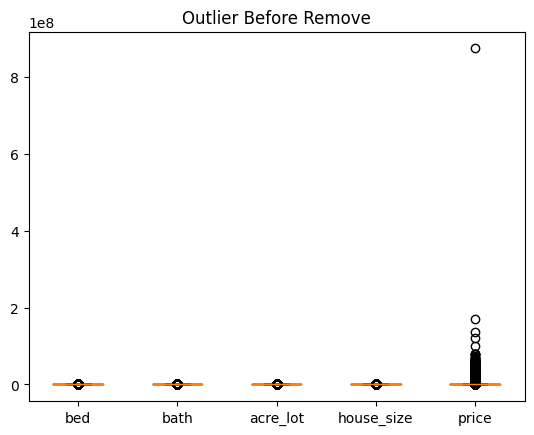

Total Row With Outlier: 136362


In [14]:
column_num = ['bed','bath','acre_lot','house_size','price']
plt.boxplot(df[column_num])
plt.xticks([1, 2, 3, 4, 5], column_num)
plt.title('Outlier Before Remove')
plt.show()
print(f'Total Row With Outlier: {df.shape[0]}')

In [15]:
Q1 = df[column_num].quantile(0.25)
Q3 = df[column_num].quantile(0.75)
IQR = Q3 - Q1

df = df[~((df[column_num] < (Q1 - 1.5 * IQR)) | (df[column_num] > (Q3 + 1.5 * IQR))).any(axis=1)]

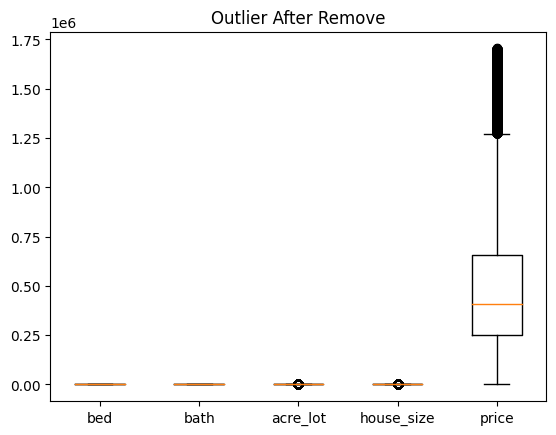

Total Row Without Outlier: 95833


In [16]:
column_num = ['bed','bath','acre_lot','house_size','price']
plt.boxplot(df[column_num])
plt.xticks([1, 2, 3, 4, 5], column_num)
plt.title('Outlier After Remove')
plt.show()
print(f'Total Row Without Outlier: {df.shape[0]}')

In [17]:
df.describe()

,bed,bath,acre_lot,zip_code,house_size,price
count,95833.000000,95833.000000,95833.000000,95833.000000,95833.000000,9.583300e+04
mean,2.948024,2.043284,0.223825,9232.322144,1441.966817,4.955795e+05
std,1.164106,0.842415,0.244563,4456.616433,567.811316,3.414376e+05
min,1.000000,1.000000,0.000000,601.000000,100.000000,0.000000e+00
25%,2.000000,1.000000,0.110000,6850.000000,1200.000000,2.499000e+05
50%,3.000000,2.000000,0.110000,8805.000000,1200.000000,4.100000e+05
75%,4.000000,3.000000,0.250000,11375.000000,1704.000000,6.580000e+05
max,7.000000,4.000000,1.230000,95000.000000,3285.000000,1.705000e+06


In [18]:
df.head()

,status,bed,bath,acre_lot,city,state,zip_code,house_size,price
0,for_sale,3.0,2.0,0.12,Adjuntas,Puerto Rico,601.0,920.0,105000.0
1,for_sale,4.0,2.0,0.08,Adjuntas,Puerto Rico,601.0,1527.0,80000.0
2,for_sale,2.0,1.0,0.15,Juana Diaz,Puerto Rico,795.0,748.0,67000.0
3,for_sale,4.0,2.0,0.10,Ponce,Puerto Rico,731.0,1800.0,145000.0
4,for_sale,6.0,2.0,0.05,Mayaguez,Puerto Rico,680.0,1200.0,65000.0


**EXPLORATORY DATA ANALYSIS**

/tmp/ipykernel_20/488824891.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr(),


<function matplotlib.pyplot.show(close=None, block=None)>

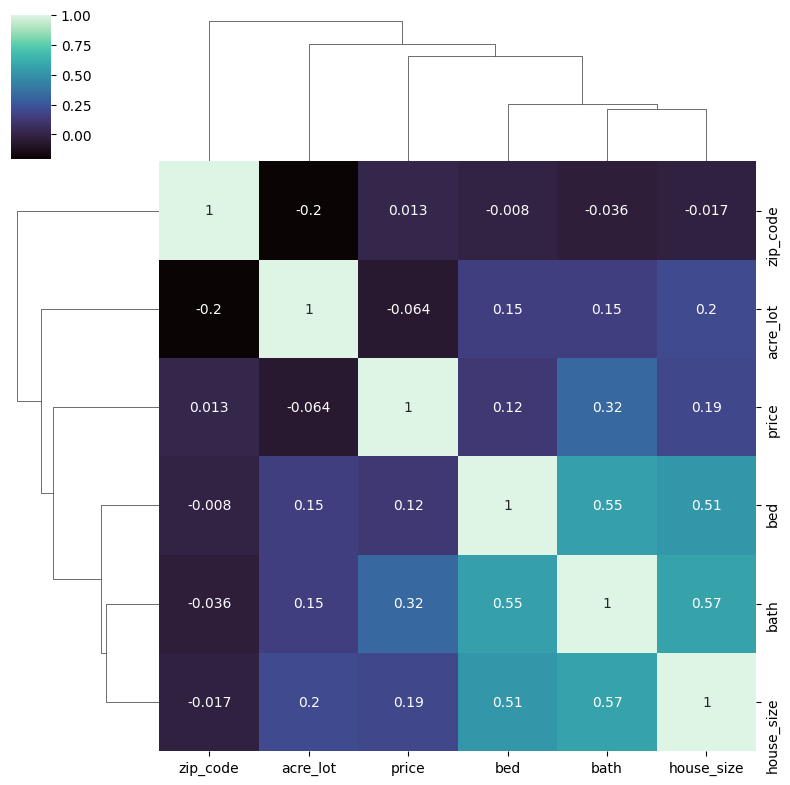

In [19]:
sns.clustermap(
    df.corr(),
    annot=True,
    cmap='mako',
    figsize=(8, 8)
)
plt.show

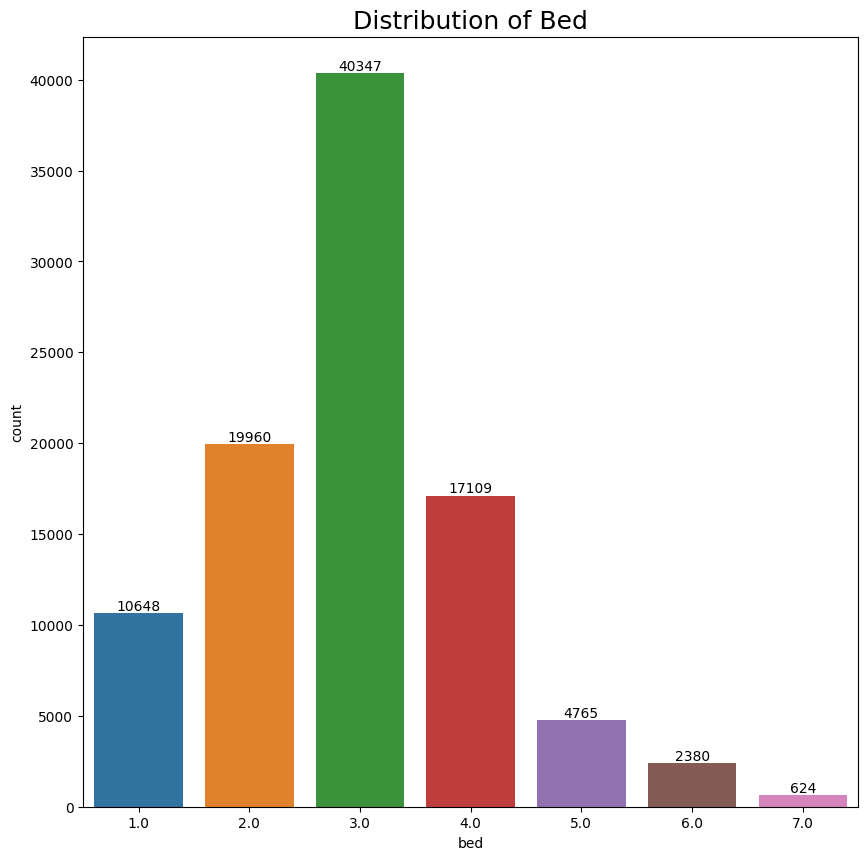

In [20]:
plt.figure(figsize=(10,10))
ax = sns.countplot(data=df, x='bed')
for i in ax.containers:
  ax.bar_label(i,)
plt.title('Distribution of Bed', fontsize=18)
plt.show()

DISTRIBUTION BY BATH

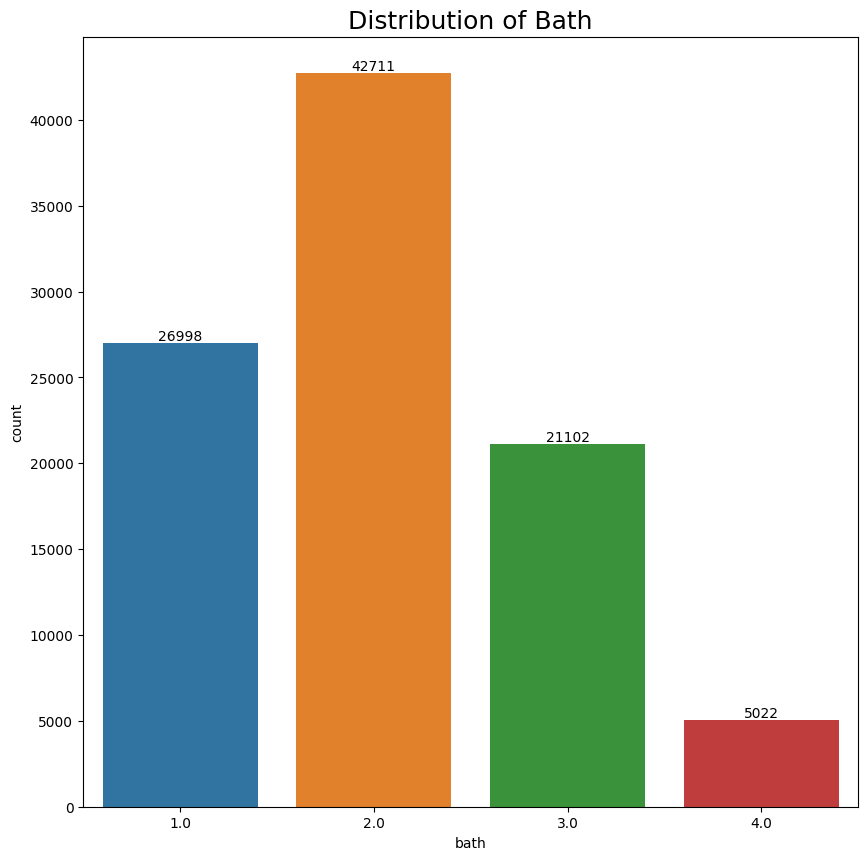

In [21]:
plt.figure(figsize=(10,10))
ax = sns.countplot(data=df, x='bath')
for i in ax.containers:
  ax.bar_label(i,)
plt.title('Distribution of Bath', fontsize=18)
plt.show()

DISTRIBUTION OF BED AND BATH

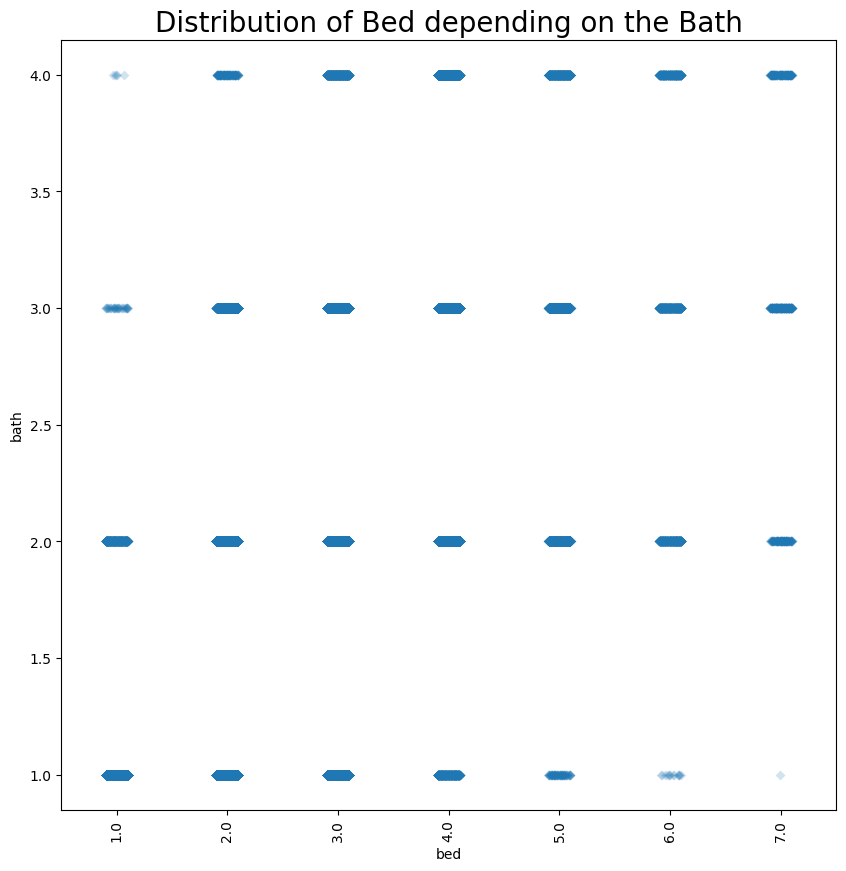

In [22]:
plt.subplots(figsize=(10,10))
plt.xticks(rotation=90)
sns.stripplot(y='bath', x='bed', data=df, marker='D', alpha=0.2)
plt.title('Distribution of Bed depending on the Bath',fontsize = 20)
plt.show()

In [23]:
df.groupby('bed', as_index=False).agg({'bath' : 'mean'}).sort_values('bath', ascending=False)

,bed,bath
6,7.0,3.075321
4,5.0,2.859182
5,6.0,2.846218
3,4.0,2.609504
2,3.0,2.047835
1,2.0,1.725000
0,1.0,1.107814


/tmp/ipykernel_20/4155772061.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  pivot = grouped.pivot('bed', 'bath', 'count')


<AxesSubplot: xlabel='bath', ylabel='bed'>

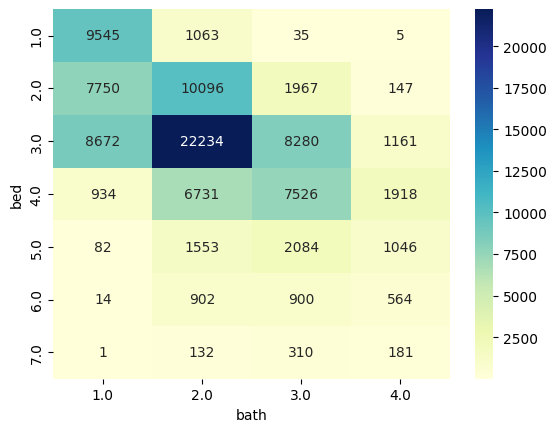

In [24]:
grouped = df.groupby(['bed', 'bath']).size().reset_index(name='count')

pivot = grouped.pivot('bed', 'bath', 'count')

sns.heatmap(pivot, cmap='YlGnBu', annot=True, fmt='g')

DISTRIBUTION OF ACRE LOT

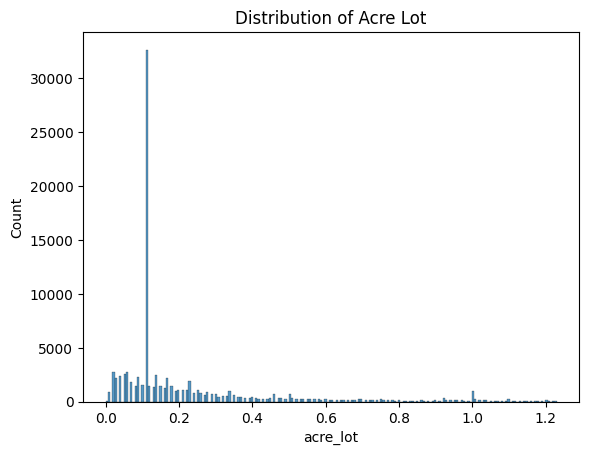

In [25]:
sns.histplot(data=df, x="acre_lot")
plt.title('Distribution of Acre Lot')
plt.show()

In [26]:
df['acre_lot'].value_counts()

0.11    32661
0.06     2737
0.02     2708
0.05     2564
0.14     2422
        ...  
1.17       71
1.09       62
1.12       60
1.22       58
1.23       55
Name: acre_lot, Length: 124, dtype: int64

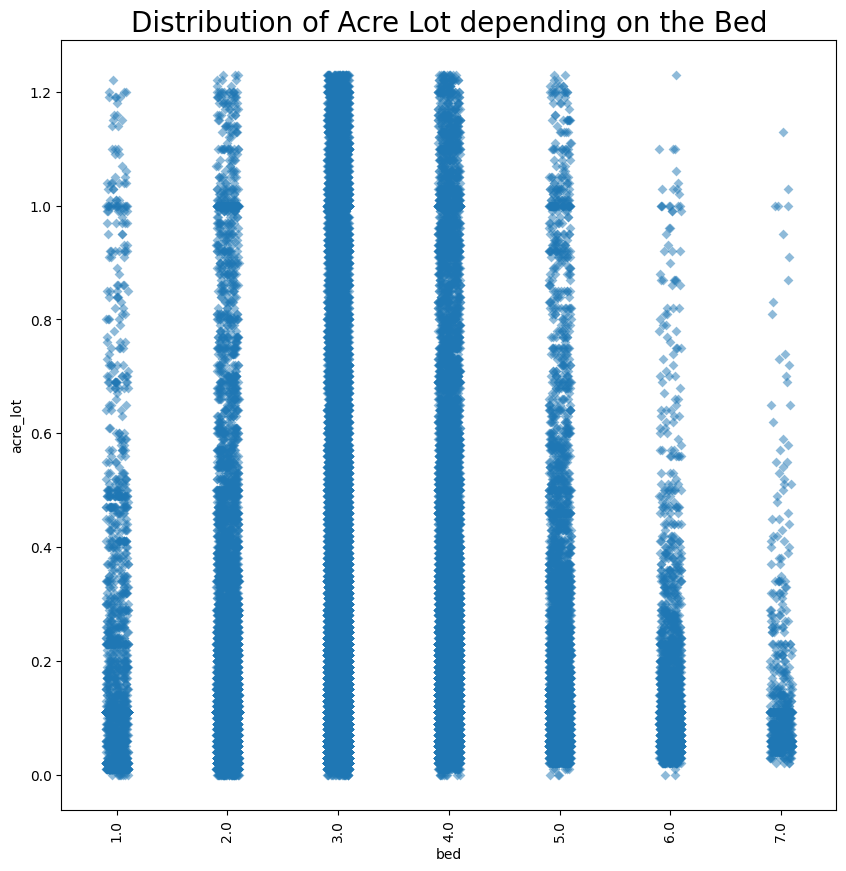

In [27]:
plt.subplots(figsize=(10,10))
plt.xticks(rotation=90)
sns.stripplot(y='acre_lot', x='bed', data=df, marker='D', alpha=0.5)
plt.title('Distribution of Acre Lot depending on the Bed',fontsize = 20)
plt.show()

In [28]:
df.groupby('bed', as_index=False).agg({'acre_lot' : 'count'}).sort_values('bed', ascending=False)

,bed,acre_lot
6,7.0,624
5,6.0,2380
4,5.0,4765
3,4.0,17109
2,3.0,40347
1,2.0,19960
0,1.0,10648


DISTRIBUTION OF THE CITY

In [29]:
City = df['city'].value_counts().reset_index().rename(columns={'index': 'city', 'city': 'count'})
top_5 = City[:5]
fig = px.bar(top_5,'city', y='count', color='city', template='plotly')
fig.update_layout(title='Distribution of Top 5 Cities with Most Houses')
fig.update_traces(texttemplate='%{y:.}', textposition='outside')
fig.show()

In [30]:
top10 = df.groupby('city')['bed'].sum().nlargest(10).reset_index()

fig = px.bar(top10, x='city', y='bed',color='bed', template='plotly', 
             title='Top 10 Cities with the Most Total Beds')
fig.update_traces(texttemplate='%{y:.}', textposition='outside')
fig.show()

In [31]:
top10 = df.groupby('city')['bath'].sum().nlargest(10).reset_index()

fig = px.bar(top10, x='city', y='bath',color='bath', template='plotly', 
             title='Top 10 Cities with the Most Total Bath')
fig.update_traces(texttemplate='%{y:.}', textposition='outside')
fig.show()

In [32]:
df_mean = df.groupby('city')[['bed', 'bath']].mean().reset_index()

df_mean_sort = df_mean.sort_values(by=['bed', 'bath'], ascending=False)

top10 = df_mean_sort.head(10)

fig = px.bar(top10, x='city', y=['bed', 'bath'], barmode='group',
             color_discrete_sequence=['blue', 'orange'],
             labels={'value': 'Mean Bed and Bath'},
             title='Top 10 Cities with Highest Mean Bed and Bath')
fig.show()

In [33]:
top10 = df.groupby('city')['acre_lot'].sum().nlargest(10).reset_index()

fig = px.bar(top10, x='city', y='acre_lot',color='city', template='plotly',
             title='Top 10 Cities with Highest Most Acre Lot') 
fig.update_traces(texttemplate='%{y:.2f}', textposition='outside')
fig.show()


In [34]:
df_mean = df.groupby('city')['acre_lot'].mean().reset_index()

df_mean_sort = df_mean.sort_values(by='acre_lot', ascending=False)

top10 = df_mean_sort.head(10)

fig = px.bar(top10, x='city', y='acre_lot', color='acre_lot', template='plotly',
             title='Top 10 Cities with Highest Mean Acre Lot')
fig.update_layout(xaxis_title='City', yaxis_title='Mean Acre Lot')
fig.update_traces(texttemplate='%{y:.2f}', textposition='outside')
fig.show()

DISTRIBUTION OF THE STATE

In [35]:
fig = px.histogram(df, x='state', nbins=25, color='state', template='plotly')
fig.update_layout(title='Distribution of State')
fig.show()

In [36]:
city_bed_count = df.groupby(['state', 'bed']).size().reset_index(name='count')

fig = px.bar(city_bed_count, x='state', y='count', color='bed', barmode='stack',
             title='Distribution of State with Bed')
fig.show()

In [37]:
df.groupby('state', as_index=False).agg({'bed' : 'mean'}).sort_values('bed', ascending=False)

,state,bed
2,Georgia,4.333333
16,West Virginia,4.000000
9,Puerto Rico,3.184461
6,New Jersey,3.144298
1,Delaware,3.131089
0,Connecticut,3.065167
8,Pennsylvania,3.055781
3,Maine,3.031873
10,Rhode Island,3.004136
11,South Carolina,3.000000


In [38]:
city_bed_count = df.groupby(['state', 'bath']).size().reset_index(name='count')

fig = px.bar(city_bed_count, x='state', y='count', color='bath', barmode='stack',
             title='Distribution of State with Bath')
fig.show()

In [39]:
df.groupby('state', as_index=False).agg({'bath' : 'mean'}).sort_values('bath', ascending=False)

,state,bath
17,Wyoming,3.000000
2,Georgia,2.666667
1,Delaware,2.234721
6,New Jersey,2.229794
0,Connecticut,2.181497
14,Virgin Islands,2.081140
13,Vermont,2.067540
5,New Hampshire,2.046819
4,Massachusetts,2.041327
10,Rhode Island,2.033085


In [40]:
df.groupby('state', as_index=False).agg({'acre_lot' : 'mean'}).sort_values('acre_lot', ascending=False)

,state,acre_lot
12,Tennessee,0.920000
14,Virgin Islands,0.559693
3,Maine,0.527866
13,Vermont,0.433871
5,New Hampshire,0.402095
2,Georgia,0.376667
0,Connecticut,0.333117
17,Wyoming,0.290000
4,Massachusetts,0.285380
10,Rhode Island,0.250215


DISTRIBUTION OF HOUSE SIZE

In [41]:
fig = px.histogram(df, x='house_size', nbins=20)
fig.update_layout(title='Distribution of House Size')
fig.show()

In [42]:
df['house_size'].value_counts()

1200.0    30605
1000.0      585
800.0       542
1100.0      519
900.0       489
          ...  
249.0         1
285.0         1
190.0         1
181.0         1
3111.0        1
Name: house_size, Length: 2976, dtype: int64

In [43]:
fig = px.histogram(df, x='house_size', color='bed', nbins=25, marginal='box', 
                   labels={'house_size':'House Size (sqft)'}, 
                   title='Distribution of House Size with Bed')

fig.show()

In [44]:
df.groupby('bed', as_index=False).agg({'house_size' : 'mean'}).sort_values('house_size', ascending=False)

,bed,house_size
5,6.0,2017.291176
6,7.0,1972.028846
4,5.0,1910.215110
3,4.0,1838.114793
2,3.0,1433.492403
1,2.0,1199.709519
0,1.0,922.474267


In [45]:
fig = px.histogram(df, x="house_size", color="bath", nbins=25, marginal="box")
fig.update_layout(title="Distribution of House Size with Bath", xaxis_title="House Size", yaxis_title="Count")
fig.show()

In [46]:
df.groupby('bath', as_index=False).agg({'house_size' : 'mean'}).sort_values('house_size', ascending=False)

,bath,house_size
3,4.0,2020.662286
2,3.0,1873.943323
1,2.0,1424.864274
0,1.0,1023.739166


In [47]:
fig = px.scatter(df, x='bed', y='bath', size='house_size', color='bed', opacity=1,
                 marginal_x='histogram', marginal_y='histogram', 
                 labels={'bed': 'Bedrooms', 'bath': 'Bathrooms', 'house_size': 'House Size'},
                 title='Distribution of House Size by Bedrooms and Bathrooms')
fig.show()

In [48]:
fig = px.histogram(df, x='acre_lot', y='house_size', color='bed',
                   marginal='box', nbins=20, opacity=0.7,
                   title='Distribution of House Size by Acre Lot and Bed')
fig.update_layout(xaxis_title='Acre Lot',
                  yaxis_title='House Size (sqft)',
                  legend_title='Bed')
fig.show()

In [49]:
fig = px.histogram(df, x='acre_lot', y='house_size', color='bath',
                   marginal='box', nbins=20, opacity=0.7,
                   title='Distribution of House Size by Acre Lot and Bath')
fig.update_layout(xaxis_title='Acre Lot',
                  yaxis_title='House Size (sqft)',
                  legend_title='Bath')
fig.show()

In [50]:
df_mean = df.groupby('acre_lot')['house_size'].mean().reset_index()

fig = px.scatter(df_mean, x='acre_lot', y='house_size', title='Average House Size by Acre Lot',trendline='ols')
fig.show()

In [51]:
df_mean = df.groupby('city')['house_size'].mean().reset_index()
df_mean_sort = df_mean.sort_values(by='house_size', ascending=False)

top10 = df_mean_sort.head(10)

fig = px.bar(top10, x='city', y='house_size', color='house_size',
             color_continuous_scale='RdYlBu_r')
fig.update_layout(title='Top 10 Cities with Highest Mean House Size',
                  xaxis_title='City', yaxis_title='Mean House Size')
fig.update_traces(texttemplate='%{y:.2f}', textposition='outside')
fig.show()




In [52]:
df.groupby('city', as_index=False).agg({'house_size' : 'mean'}).sort_values('house_size', ascending=False)

,city,house_size
207,Blaine,3280.0
452,Cold Spring Hrbr,3200.0
2176,Stanfordville,3171.0
2351,Voorhees Township,3100.0
576,Doylestown,3071.0
...,...,...
2412,Wellington,448.0
64,Argyle Township,432.0
2340,Vienna,300.0
363,Cathance Township,192.0


In [53]:
df_mean = df.groupby('state')['house_size'].mean().reset_index()

df_mean_sort = df_mean.sort_values(by='house_size', ascending=False)

fig = px.bar(df_mean_sort, x='state', y='house_size', color='state')
fig.update_layout(title='Top 10 States with Highest Average House Size',
                  xaxis_title='State',
                  yaxis_title='Average House Size (sqft)')
fig.update_traces(texttemplate='%{y:.1f}', textposition='outside')
fig.show()

In [54]:
df.groupby('state', as_index=False).agg({'house_size' : 'mean'}).sort_values('house_size', ascending=False)

,state,house_size
2,Georgia,2477.333333
17,Wyoming,1935.000000
16,West Virginia,1860.000000
1,Delaware,1780.287865
0,Connecticut,1606.702172
5,New Hampshire,1593.878151
4,Massachusetts,1566.304041
13,Vermont,1560.324597
10,Rhode Island,1544.503309
8,Pennsylvania,1514.621450


DISTRIBUTION OF PRICE

In [55]:
fig = px.histogram(df, x="price", nbins=25, template="plotly")
fig.update_layout(title="Distribution of Price")
fig.show()

In [56]:
df['price'].value_counts()

599000.0     873
499000.0     860
399000.0     807
699000.0     779
325000.0     744
            ... 
637500.0       1
1579900.0      1
837000.0       1
698777.0       1
567654.0       1
Name: price, Length: 5863, dtype: int64

In [57]:
fig = px.histogram(df, x="price", color="bed", nbins=20)
fig.update_layout(title="Distribution of Price by Bed", xaxis_title="Price", yaxis_title="Count")
fig.show()

In [58]:
df.groupby('bed', as_index=False).agg({'price' : 'mean'}).sort_values('price', ascending=False)

,bed,price
6,7.0,694834.740385
4,5.0,678554.904302
5,6.0,605179.984874
3,4.0,583391.463791
0,1.0,514857.388242
1,2.0,478931.833768
2,3.0,430334.971795


In [59]:
fig = px.histogram(df, x="price", color="bath", nbins=20)
fig.update_layout(title="Distribution of Price by Bath", xaxis_title="Price", yaxis_title="Count")
fig.show()

In [60]:
df.groupby('bath', as_index=False).agg({'price' : 'mean'}).sort_values('price', ascending=False)

,bath,price
3,4.0,824913.118877
2,3.0,629790.272628
1,2.0,453630.968462
0,1.0,395780.783169


In [61]:
df_mean = df.groupby('acre_lot')['price'].mean().reset_index()

# plot mean price per acre lot
fig = px.scatter(df_mean, x='acre_lot', y='price', trendline='ols')
fig.update_layout(title='Average Price per Acre Lot', xaxis_title='Acre Lot', yaxis_title='Price')
fig.show()

In [62]:
df_mean = df.groupby('city')['price'].mean().reset_index()

df_mean_sort = df_mean.sort_values(by='price', ascending=False)

top10 = df_mean_sort.head(10)

fig = px.bar(top10, x='city', y='price', color='city',
             labels={'city': 'City', 'price': 'Mean Price'},
             title='Top 10 Cities with the Highest Average Price')
fig.update_traces(texttemplate='%{y:.1f}', textposition='outside')
fig.show()

In [63]:
df.groupby('city', as_index=False).agg({'price' : 'mean'}).sort_values('price', ascending=False)

,city,price
1876,Rehoboth Beach,1.700000e+06
2014,Santurce,1.685000e+06
2476,Westchester County,1.679000e+06
1598,North Hills,1.614167e+06
1980,Sagaponack,1.599000e+06
...,...,...
157,Beekmantown,1.090000e+04
287,Brookton,9.900000e+03
1218,Lexington Dr,2.990000e+03
1009,Hills Rd,2.990000e+03


In [64]:
df_mean = df.groupby('state')['price'].mean().reset_index()

df_mean_sort = df_mean.sort_values(by='price', ascending=False)

fig = px.bar(df_mean_sort, x='state', y='price',
             title='Top 10 States with Highest Mean Price',
             labels={'state': 'State', 'price': 'Mean Price'})
fig.update_traces(texttemplate='%{y:.1f}', textposition='outside')
fig.show()

In [65]:
df.groupby('state', as_index=False).agg({'price' : 'mean'}).sort_values('price', ascending=False)

,state,price
7,New York,636222.367958
4,Massachusetts,581396.818252
15,Virginia,555571.428571
17,Wyoming,535000.000000
6,New Jersey,447518.460864
10,Rhode Island,420581.616212
2,Georgia,372310.000000
0,Connecticut,358832.852244
5,New Hampshire,355317.869748
8,Pennsylvania,325632.629817


In [66]:
df_mean = df.groupby('price')['house_size'].mean().reset_index()

fig = px.scatter(df_mean, x='price', y='house_size', trendline='ols', 
                 labels={'price':'Price', 'house_size':'Mean House Size'})
fig.update_layout(title='Distribution of Mean House Size by Price')
fig.show()

In [67]:
fig = px.scatter(df, x='house_size', y='price', color='bed', size='bath',trendline='ols')
fig.update_layout(title='House Size vs Price',
                  xaxis_title='House Size',
                  yaxis_title='Price')
fig.show()


**MODEL PREDICTING PRICE HOUSE**

In [68]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import RidgeCV, ElasticNetCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.neighbors import KNeighborsRegressor


In [69]:
df['house_size'] = StandardScaler().fit_transform(df['house_size'].values.reshape(len(df), 1))
df['price'] = StandardScaler().fit_transform(df['price'].values.reshape(len(df), 1))

In [70]:
df['bed'] = MinMaxScaler().fit_transform(df['bed'].values.reshape(len(df), 1))
df['bath'] = MinMaxScaler().fit_transform(df['bath'].values.reshape(len(df), 1))
df['acre_lot'] = MinMaxScaler().fit_transform(df['acre_lot'].values.reshape(len(df), 1))

In [71]:
df.head()

,status,bed,bath,acre_lot,city,state,zip_code,house_size,price
0,for_sale,0.333333,0.333333,0.097561,Adjuntas,Puerto Rico,601.0,-0.919266,-1.143933
1,for_sale,0.500000,0.333333,0.065041,Adjuntas,Puerto Rico,601.0,0.149757,-1.217153
2,for_sale,0.166667,0.000000,0.121951,Juana Diaz,Puerto Rico,795.0,-1.222185,-1.255227
3,for_sale,0.500000,0.333333,0.081301,Ponce,Puerto Rico,731.0,0.630553,-1.026780
4,for_sale,0.833333,0.333333,0.040650,Mayaguez,Puerto Rico,680.0,-0.426142,-1.261085


In [72]:
X = df[['bed', 'bath', 'acre_lot', 'house_size', 'city', 'state', 'zip_code']]
y = df['price']

# one-hot encode the categorical features
X = pd.get_dummies(X, columns=['city', 'state', 'zip_code'])

# split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [73]:
#create the decision tree model
model_DT = DecisionTreeRegressor(max_depth=5)

# fit the model to the training data
model_DT.fit(X_train, y_train)

# make predictions on the testing data
y_pred = model_DT.predict(X_test)

# calculate
mse_DT = mean_squared_error(y_test, y_pred)
rmse_DT = mean_squared_error(y_test, y_pred, squared=False)
mae_DT = mean_absolute_error(y_test, y_pred)
r2_DT = r2_score(y_test, y_pred)

In [74]:
# create a Random Forest model and train it using training data
model_RF = RandomForestRegressor(n_estimators=100, random_state=42)
model_RF.fit(X_train, y_train)

# make predictions using testing data
y_pred = model_RF.predict(X_test)

# calculate the average error value using the MSE metric
mse_RF = mean_squared_error(y_test, y_pred)
rmse_RF = mean_squared_error(y_test, y_pred, squared=False)
mae_RF = mean_absolute_error(y_test, y_pred)
r2_RF = r2_score(y_test, y_pred)

In [75]:
# Create a Gradient Boosting model and perform training on the training data
model_GD = GradientBoostingRegressor(learning_rate=0.05,
    n_estimators=150,
    max_depth=3,
    min_samples_split=4,
    min_samples_leaf=1)
model_GD.fit(X_train, y_train)

# Make predictions on testing data
y_pred = model_GD.predict(X_test)

# Evaluate model performance
mse_GD = mean_squared_error(y_test, y_pred)
rmse_GD = mean_squared_error(y_test, y_pred, squared=False)
mae_GD = mean_absolute_error(y_test, y_pred)
r2_GD = r2_score(y_test, y_pred)

In [76]:
ridge_cv_model = RidgeCV(alphas=(1.38), scoring='neg_mean_absolute_error')
ridge_cv_model.fit(X_train, y_train)

y_pred = ridge_cv_model.predict(X_test)

mse_R = mean_squared_error(y_test, y_pred)
rmse_R = mean_squared_error(y_test, y_pred, squared=False)
mae_R = mean_absolute_error(y_test, y_pred)
r2_R = r2_score(y_test, y_pred)

In [77]:
elastic_model = ElasticNetCV(l1_ratio=[0.01], tol=0.01)
elastic_model.fit(X_train, y_train)

y_pred = elastic_model.predict(X_test)

mse_E = mean_squared_error(y_test, y_pred)
rmse_E = mean_squared_error(y_test, y_pred, squared=False)
mae_E = mean_absolute_error(y_test, y_pred)
r2_E = r2_score(y_test, y_pred)

In [78]:
from sklearn.neighbors import KNeighborsRegressor
knn = KNeighborsRegressor(n_neighbors=10)

knn.fit(X_train,y_train)
y_pred = knn.predict(X_test)

mse_KNN = mean_squared_error(y_test, y_pred)
rmse_KNN = mean_squared_error(y_test, y_pred, squared=False)
mae_KNN = mean_absolute_error(y_test, y_pred)
r2_KNN = r2_score(y_test, y_pred) 

In [79]:
results = {
    'Decision Tree': {'MSE': mse_DT, 'RMSE': rmse_DT, 'MAE': mae_DT, 'R^2': r2_DT},
    'Random Forest': {'MSE': mse_RF, 'RMSE': rmse_RF, 'MAE': mae_RF, 'R^2': r2_RF},
    'Gradient Boosting': {'MSE': mse_GD, 'RMSE': rmse_GD, 'MAE': mae_GD, 'R^2': r2_GD},
    'Ridge CV': {'MSE': mse_R, 'RMSE': rmse_R, 'MAE': mae_R, 'R^2': r2_R},
    'ElasticNet CV': {'MSE': mse_E, 'RMSE': rmse_E, 'MAE': mae_E, 'R^2': r2_E},
    'KNN': {'MSE': mse_KNN, 'RMSE': rmse_KNN, 'MAE': mae_KNN, 'R^2': r2_KNN},
}

# Convert dictionary into dataframe
data = pd.DataFrame.from_dict(results, orient='index')
data = data.applymap(lambda x: f'{x:.2f}')
# Print the dataframe
print(data)

                    MSE  RMSE   MAE   R^2
Decision Tree      0.61  0.78  0.57  0.40
Random Forest      0.31  0.56  0.36  0.69
Gradient Boosting  0.54  0.73  0.54  0.47
Ridge CV           0.33  0.58  0.41  0.67
ElasticNet CV      0.61  0.78  0.57  0.40
KNN                0.28  0.53  0.35  0.72


In [80]:
from sklearn.ensemble import VotingRegressor


# Create an ensemble model using VotingRegressor
ensemble_model = VotingRegressor(estimators=[
    ('random_forest', model_RF),
    ('knn', knn),
    ('Ridge CV',ridge_cv_model)
])

# Train the ensemble model using training data
ensemble_model.fit(X_train, y_train)

# Make predictions using testing data
y_pred_ensemble = ensemble_model.predict(X_test)

# Calculate the average error values using different metrics
mse_ensemble = mean_squared_error(y_test, y_pred_ensemble)
rmse_ensemble = mean_squared_error(y_test, y_pred_ensemble, squared=False)
mae_ensemble = mean_absolute_error(y_test, y_pred_ensemble)
r2_ensemble = r2_score(y_test, y_pred_ensemble)
   

In [81]:
print("Ensemble Model Metrics:")
print("Mean Squared Error (MSE):", mse_ensemble)
print("Root Mean Squared Error (RMSE):", rmse_ensemble)
print("Mean Absolute Error (MAE):", mae_ensemble)
print("R-squared (R2):", r2_ensemble)


Ensemble Model Metrics:
Mean Squared Error (MSE): 0.2511340786748162
Root Mean Squared Error (RMSE): 0.5011327954492862
Mean Absolute Error (MAE): 0.3334605126500662
R-squared (R2): 0.7517048113571759
